###Установка и импорт библиотек

In [3]:
!pip install torch torchvision matplotlib tqdm ipywidgets ftfy regex
!pip install git+https://github.com/openai/CLIP.git
!pip install omegaconf pytorch-lightning einops kornia

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, utils
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
import clip
import os
import glob
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Используется устройство: {device}")

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-o0j5ymsh
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-o0j5ymsh
  Resolved https://github.com/openai/CLIP.git to commit d05afc436d78f1c48dc0dbf8e5980a9d471f35f6
  Preparing metadata (setup.py) ... done
Используется устройство: cuda


#DCGAN – генерация с нуля

###Загрузка датасета (Portrait HD)

In [13]:
!wget http://www.soshnikov.com/permanent/data/petfaces.tar.gz
!tar -xf petfaces.tar.gz
!rm petfaces.tar.gz

transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset = datasets.ImageFolder(root="petfaces", transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=2)
print(f"Загружено изображений: {len(dataset)}")

--2026-05-11 20:48:36--  http://www.soshnikov.com/permanent/data/petfaces.tar.gz
Resolving www.soshnikov.com (www.soshnikov.com)... 79.137.227.122
Connecting to www.soshnikov.com (www.soshnikov.com)|79.137.227.122|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24483412 (23M) [application/x-tar]
Saving to: ‘petfaces.tar.gz’

petfaces.tar.gz     100%[===================>]  23.35M   187KB/s    in 2m 16s  

2026-05-11 20:50:53 (176 KB/s) - ‘petfaces.tar.gz’ saved [24483412/24483412]

Загружено изображений: 3211


###Определяем генератор и дискриминатор

In [18]:
class Generator(nn.Module):
    def __init__(self, nz=100, ngf=64, nc=3):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh(),
        )
        self.to_128 = nn.Sequential(
            nn.ConvTranspose2d(nc, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.main(x)
        x = self.to_128(x)
        return x

class Discriminator(nn.Module):
    def __init__(self, ndf=64, nc=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # (nc, 128,128) -> (ndf, 64,64)
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # -> (ndf*2, 32,32)
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),
            # -> (ndf*4, 16,16)
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),
            # -> (ndf*8, 8,8)
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),
            # -> (1, 4,4)
            nn.Conv2d(ndf*8, 1, 4, 2, 1, bias=False),
            nn.AdaptiveAvgPool2d(1),   # (batch,1,1,1)
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x).view(-1, 1)

netG = Generator().to(device)
netD = Discriminator().to(device)

###Обучение DCGAN

Epoch 1:   0%|          | 0/51 [00:00<?, ?it/s]

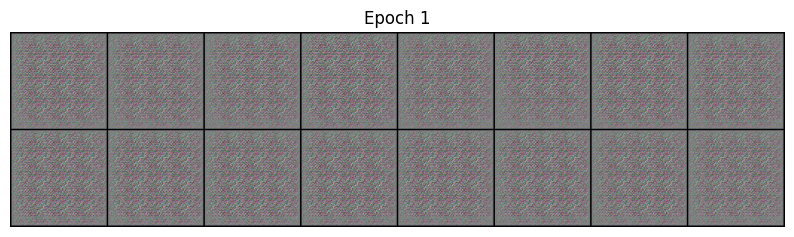

Epoch 2:   0%|          | 0/51 [00:00<?, ?it/s]

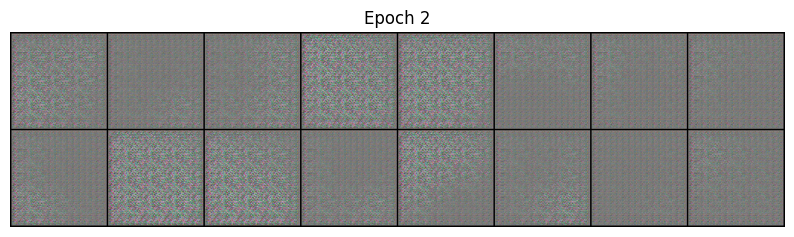

Epoch 3:   0%|          | 0/51 [00:00<?, ?it/s]

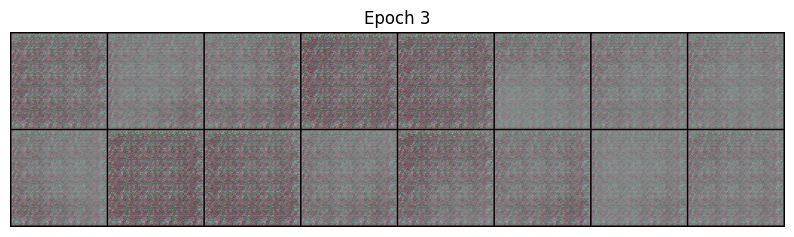

Epoch 4:   0%|          | 0/51 [00:00<?, ?it/s]

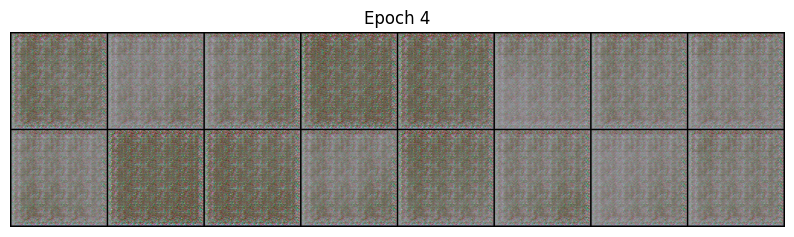

Epoch 5:   0%|          | 0/51 [00:00<?, ?it/s]

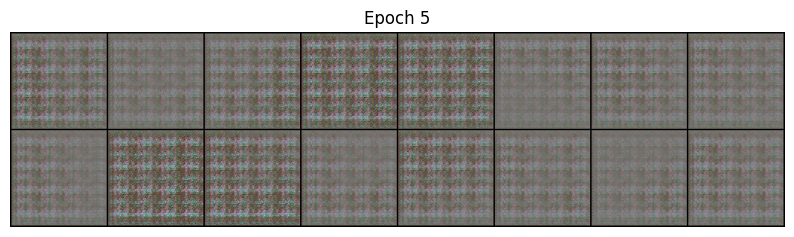

Epoch 6:   0%|          | 0/51 [00:00<?, ?it/s]

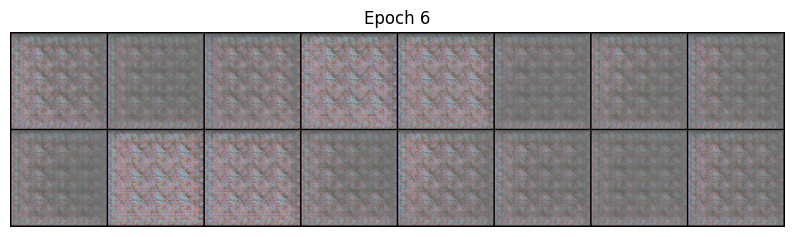

Epoch 7:   0%|          | 0/51 [00:00<?, ?it/s]

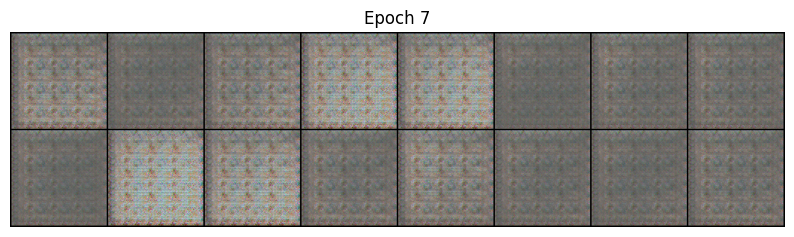

Epoch 8:   0%|          | 0/51 [00:00<?, ?it/s]

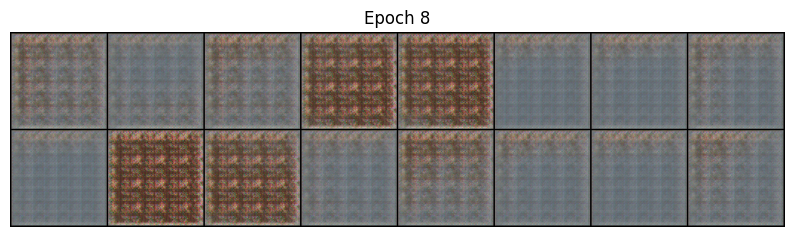

Epoch 9:   0%|          | 0/51 [00:00<?, ?it/s]

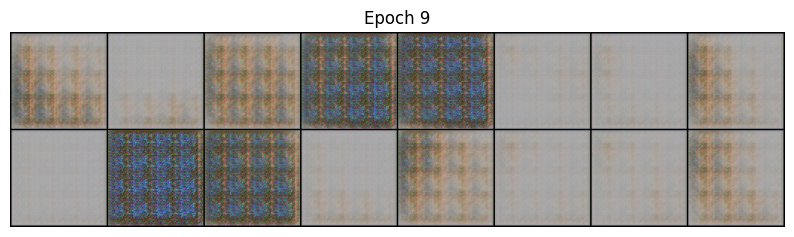

Epoch 10:   0%|          | 0/51 [00:00<?, ?it/s]

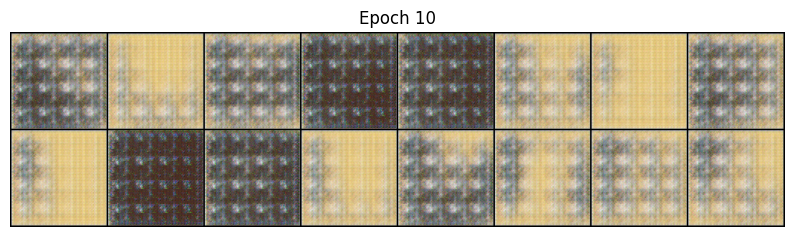

Epoch 11:   0%|          | 0/51 [00:00<?, ?it/s]

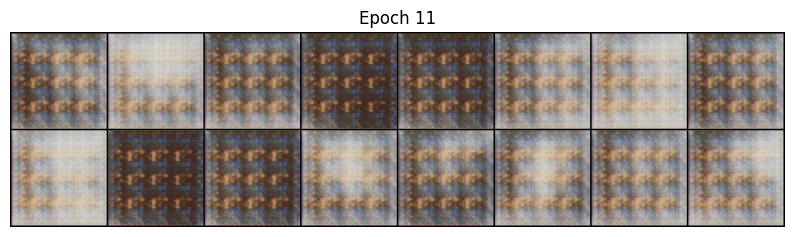

Epoch 12:   0%|          | 0/51 [00:00<?, ?it/s]

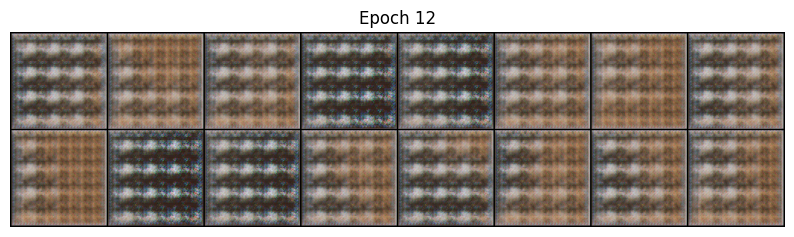

Epoch 13:   0%|          | 0/51 [00:00<?, ?it/s]

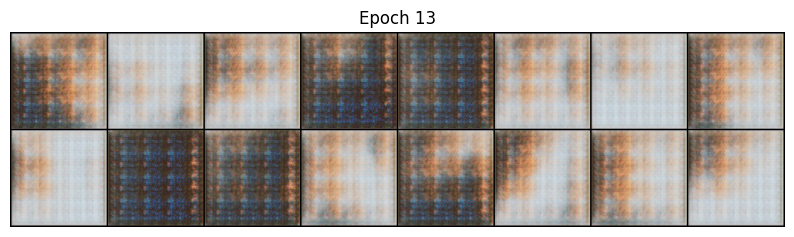

Epoch 14:   0%|          | 0/51 [00:00<?, ?it/s]

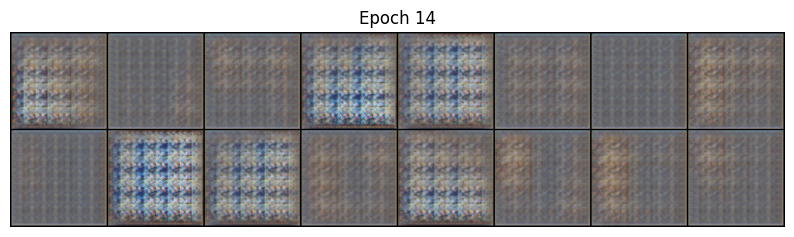

Epoch 15:   0%|          | 0/51 [00:00<?, ?it/s]

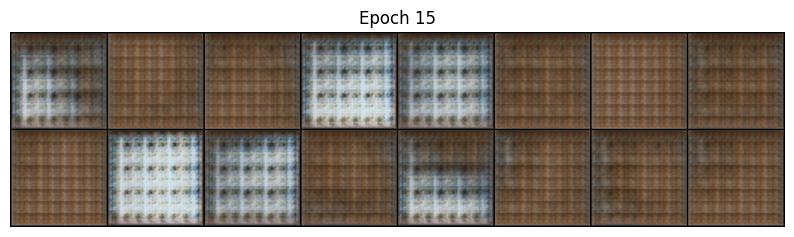

Epoch 16:   0%|          | 0/51 [00:00<?, ?it/s]

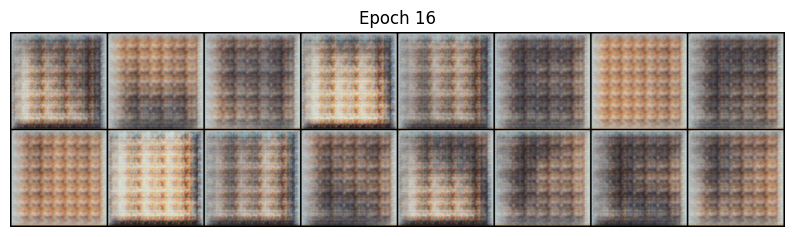

Epoch 17:   0%|          | 0/51 [00:00<?, ?it/s]

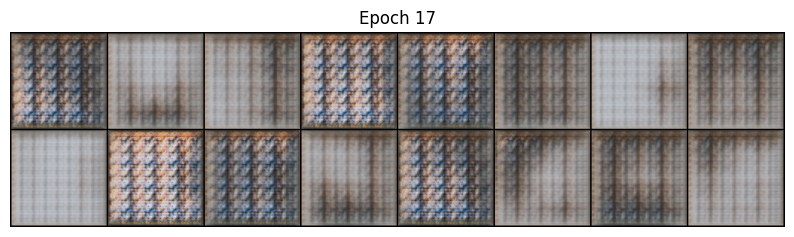

Epoch 18:   0%|          | 0/51 [00:00<?, ?it/s]

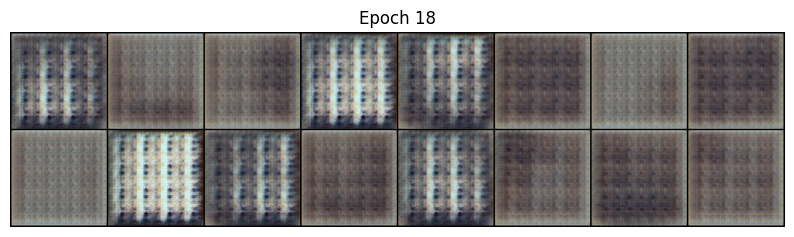

Epoch 19:   0%|          | 0/51 [00:00<?, ?it/s]

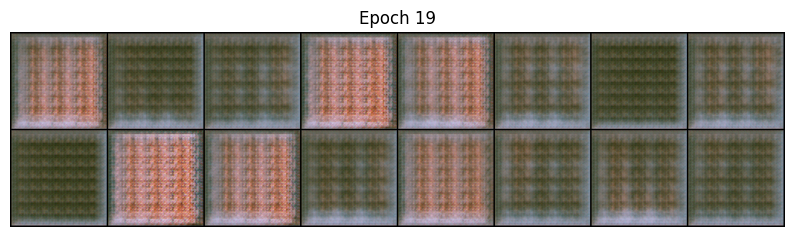

Epoch 20:   0%|          | 0/51 [00:00<?, ?it/s]

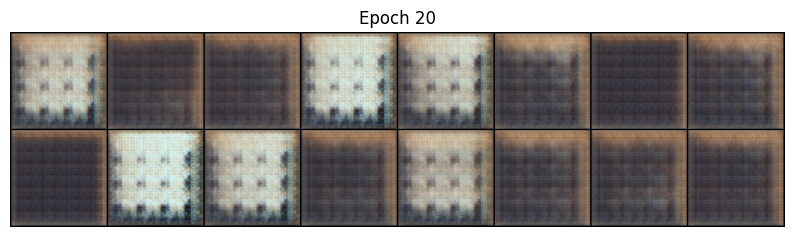

In [19]:
nz = 100
criterion = nn.BCELoss()
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))

fixed_noise = torch.randn(64, nz, 1, 1, device=device)
epochs = 20

for epoch in range(epochs):
    for i, (data, _) in enumerate(tqdm(dataloader, desc=f"Epoch {epoch+1}")):
        real_imgs = data.to(device)
        bs = real_imgs.size(0)
        real_labels = torch.ones(bs, 1, device=device)
        fake_labels = torch.zeros(bs, 1, device=device)

        # Обучение дискриминатора
        netD.zero_grad()
        real_loss = criterion(netD(real_imgs), real_labels)
        noise = torch.randn(bs, nz, 1, 1, device=device)
        fake_imgs = netG(noise)
        fake_loss = criterion(netD(fake_imgs.detach()), fake_labels)
        d_loss = real_loss + fake_loss
        d_loss.backward()
        optimizerD.step()

        # Обучение генератора
        netG.zero_grad()
        g_loss = criterion(netD(fake_imgs), real_labels)
        g_loss.backward()
        optimizerG.step()

    # Показ и сохранение
    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
        grid = utils.make_grid(fake[:16], normalize=True)
        plt.figure(figsize=(10,10))
        plt.imshow(np.transpose(grid, (1,2,0)))
        plt.axis('off')
        plt.title(f"Epoch {epoch+1}")
        plt.show()
    torch.save(netG.state_dict(), f'dcgan128_epoch_{epoch+1}.pth')

###Результат DCGAN

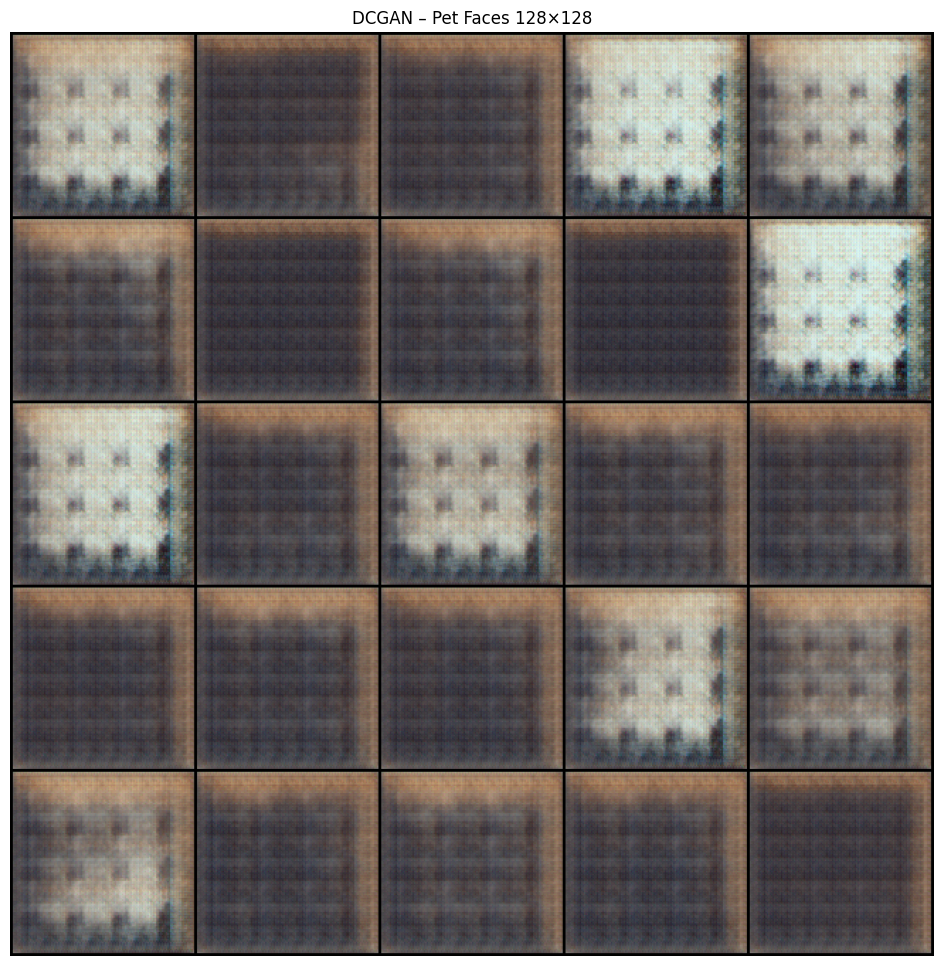

In [20]:
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid = utils.make_grid(fake[:25], nrow=5, normalize=True)
    plt.figure(figsize=(12,12))
    plt.imshow(np.transpose(grid, (1,2,0)))
    plt.axis('off')
    plt.title("DCGAN – Pet Faces 128×128")
    plt.show()